# Lecture VIII 

Modelling and Machine Learning of Dynamical Systems in Julia


# Climate Models (Part I)

## Contents 

* A very brief introduction into climate modelling 
* Energy balance models 
* The Lorenz 96 model
* Julia/Programming: CICD 

## Climate Modelling 

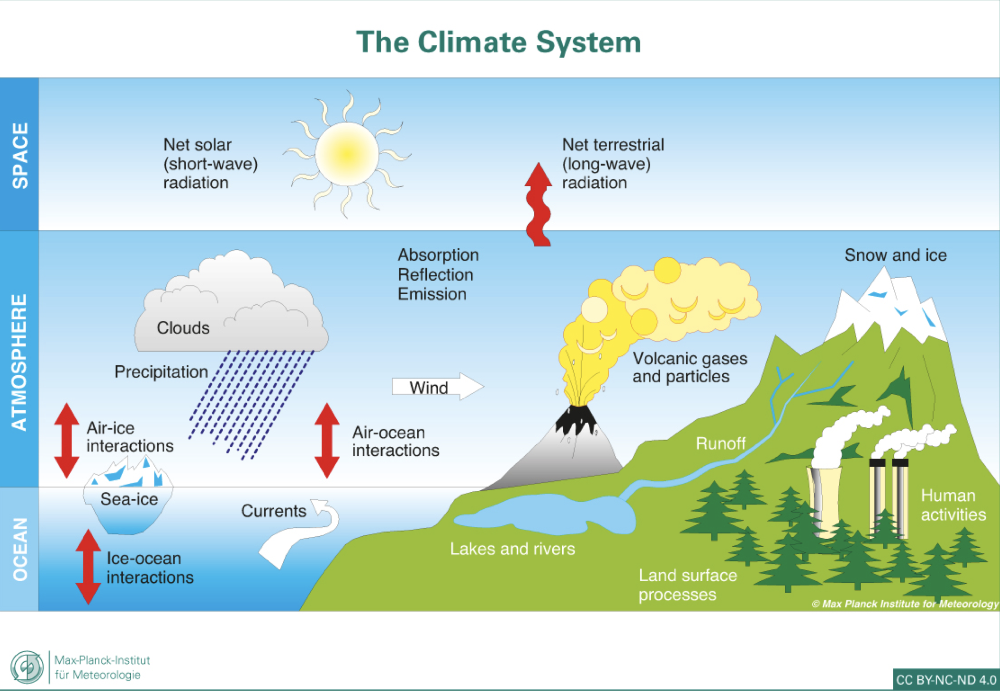

* Climate models are large comprehensive models 
* The are made up of many submodels, each often comprising another set of submodels that are all coupled together in the end



## Components of Climate Models 

### Atmosphere 

* Navier-Stokes equation: $$\frac{\partial}{\partial t}(\rho\mathbf{u}) + \nabla\cdot\left(\rho\mathbf{u}\mathbf{u}^T\right) = -\nabla p + \nabla\cdot\tau + \rho\mathbf{g}$$
* with: $\mathbf{u}$ velocity field, $\rho$ density, $\nabla=\left(\frac{\partial}{\partial x},\frac{\partial}{\partial y},\frac{\partial}{\partial z}\right)$ nabla operator (spatial derivatives), $p$ pressure, $\tau$ stress tensor, $g$ body accelarations (e.g. gravity)
* The Navier-Stokes equations is very hard to solve, usually some approximations are needed 

#### Rayleigh-Benard Convection: Lorenz 63 Model 

* We've seen one approximation a few lectures ago, the Lorenz 63 model for the Rayleigh-Benard Convection

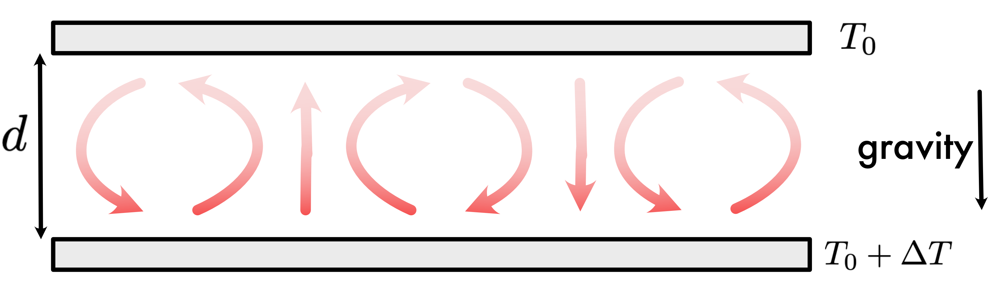

* We've seen that a crude approximation for the streamfunction $\mathbf{u} = \nabla\psi$ and temperature profile $\theta$ is given by 

$$\begin{align}\theta(x,z,t) &= \frac{R_c \delta T}{\pi R}\left(\sqrt{2}Y(t)\cos(\pi x/l)\sin(\pi z/d) - Z(t)\sin(2 \pi z/d)\right)\\
\psi(x,z,t) &= \frac{1 - (d/l)^2\kappa}{d/l}\sqrt{2}X(t)\sin(\pi x/l)\sin(\pi z/d)\end{align}$$

where the temporal evolution follows: 

$$\begin{align}\frac{dX}{dt} &= -\sigma X + \sigma Y \\
\frac{dY}{dt} &= -XZ + rX - Y \\
\frac{dZ}{dt} &= XY - bZ\end{align}$$

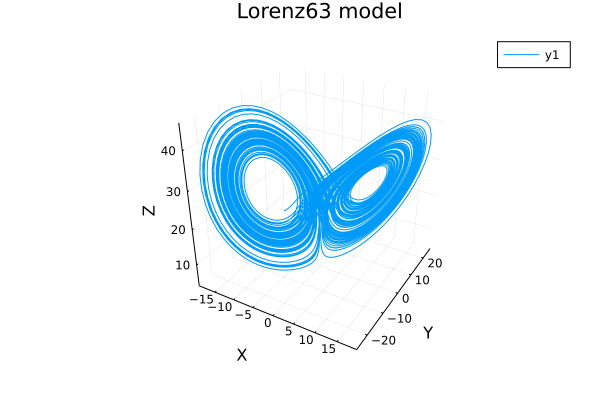

In [1]:
using DynamicalSystems, Plots
ds = DynamicalSystems.Systems.lorenz();
tr = trajectory(ds,100.,Ttr=50.);
plot(tr[:,1],tr[:,2],tr[:,3], xlabel="X",ylabel="Y",zlabel="Z",title="Lorenz63 model")

* We've seen that this is a chaotic system with a strong sensitivity to changes of its initial condition


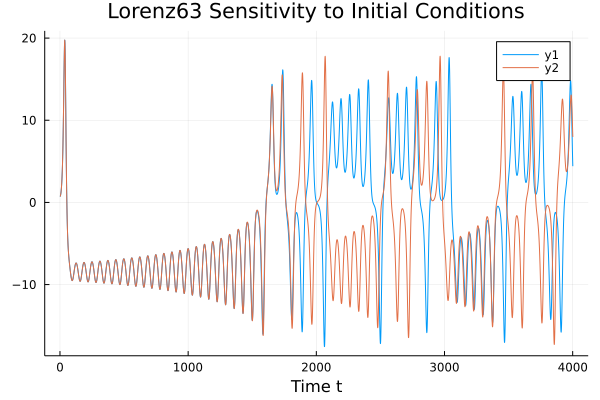

In [2]:
u0=rand(3)
tr = trajectory(Systems.lorenz(u0),40.,Ttr=0.);
tr2 = trajectory(Systems.lorenz(u0 .+ 0.01),40.,Ttr=0.);
plot(tr[:,1])
plot!(tr2[:,1], title="Lorenz63 Sensitivity to Initial Conditions", xlabel="Time t")

* This is true for all (meaningful) approximations to the Navier-Stokes approximation 
* Meteorology deals with these approximations in a systematic manner
* One very common approximation is the *shallow water approximation* 
    * The Navier-Stokes equation formulated in spherical coordinates, for which the height of the atmosphere is seen small against Earth's radius and thus some derivative with respect to the radius are neglected  
* Other approximations often stem from a scale analysis of the equation, only keeping terms that are responsible for large-scale motions

## Ocean 

* Navier-Stokes equation: $$\frac{\partial}{\partial t}(\rho\mathbf{u}) + \nabla\cdot\left(\rho\mathbf{u}\mathbf{u}^T\right) = -\nabla p + \nabla\cdot\tau + \rho\mathbf{g}$$
* The different fluid leads to slightly different results for the scale analysis but overall a similar approach as for the atmosphere

## Ice Sheets & Sea Ice 

* Based on thermodynamics and mechanics for the ice stress / deformation 

## Vegetation Models 

* More empirical models how vegetation reacts to climate (e.g. precipitation) and how it affects the local (and global) climate

## Submodels 

* Each of these has additionally usually several submodels, e.g. a fire model of a vegetation model or a cloud resolving model for the atmosphere
* All models and submodels are coupled together
* Coupling parameters are found partially by knowledge, partially by fitting the model to past observations

## Weather vs. Climate 

* Weather is a short-term condition/state, e.g. the temperature/precipition at a specific place and date
    * The forecast of a single trajectory of a system 
    * The forecast is limited by the chaotic nature of the system
* Climate are long-term averages 
    * The position and shape of the attractor 
* In practice numerical weather prediction models and climate models are very similar 
* Numerical weather prediction can run at higher resolutions and with some more processes modelled as only short trajectories are needed
* Climate models have integrate trajectories for a few decades at least, thus they need to run faster

## Energy Balance Models (EBMs)

* Highly simplified models that determine the temperatur of the surface of the Earth by considering the balance of in- and outgoing radition, i.e. energy

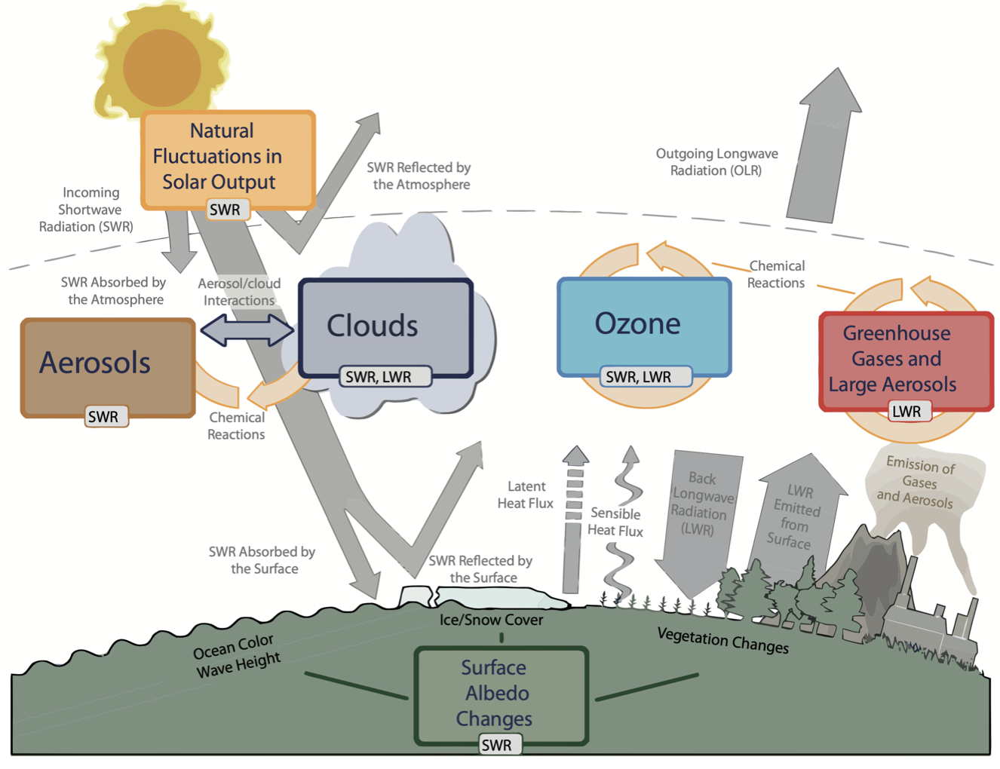 (Figure IPCC AR5)

### Zero-Dimensional EBMs 

* The average surface temperature $T$ is approximately in an equilibrium. It is changing slowly due to natural variability and anthropogenic climate change but these are long-term effects, that we will neglect for our very course models
* For an equilibrium, we have to find fixed points of the model: 

$$\begin{align} 
\frac{dE}{dt} &= E_{in}(T) - E_{out}(T)\\
0 &= E_{in}(T) - E_{out}(T)
\end{align}$$

$$\frac{dE}{dt} = (1 - \alpha)\frac{\pi r^2}{4\pi r^2} S_0 - \sigma T^4$$


* $\alpha$ is the albedo, so reflectivity of the surface, $\alpha=1$ means all raditation is reflected, for $\alpha=0$ all is absorbed, Earth's average albedo is $\approx0.3$
* $\frac{\pi r^2}{4\pi r^2}$ is the ratio of cross-section to surface of a sphere
    * this is present as the Earth emmits radiation over its complete surface but only receives radition on one side
* $S_0$ is the solar constant $1363 Wm^{-2}$
* $\sigma T^4$ is the outgoing black body radition according the Stefan Boltzmann law, with the Boltzmann constant $5.67\cdot10^{-8}Wm^{-2}K^{-4}$


### Albedo of Typical Surfaces 
<div>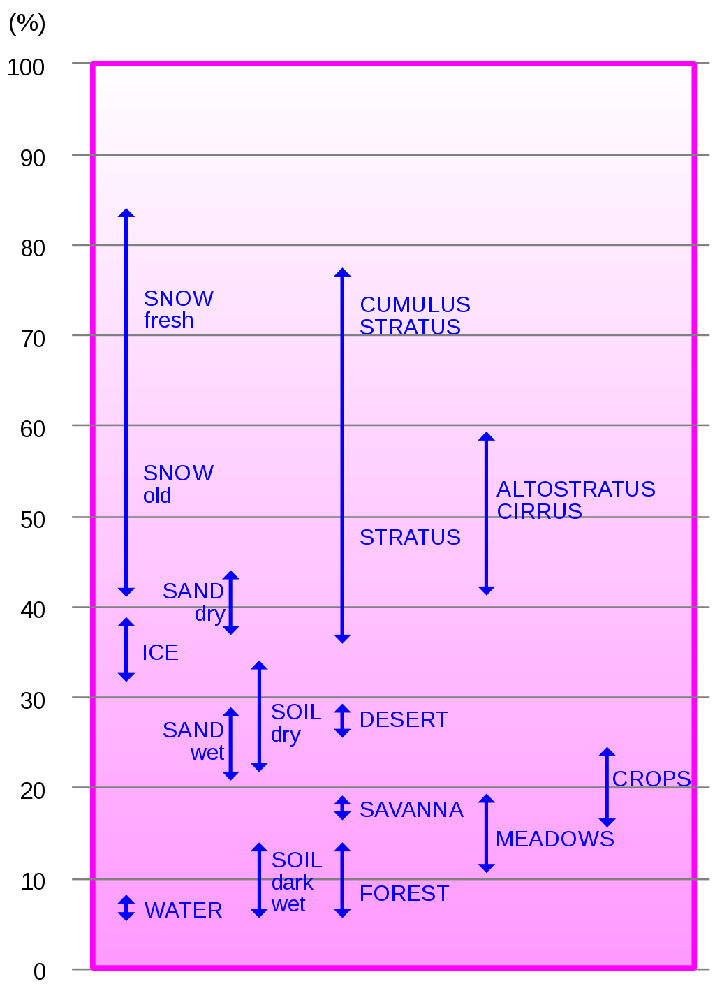</div>

(Figure CC BY-SA 2.5, Wikipedia, won't work in the html version, here's a [link]( https://en.wikipedia.org/wiki/Albedo#/media/File:Albedo-e_hg.svg))

* Ice-albedo feedback - is an example of a positive feedback loop: higher temperatures lead to less snowy and icy surfaces which lead to decrease in albedo which lead to a further increase in temperature


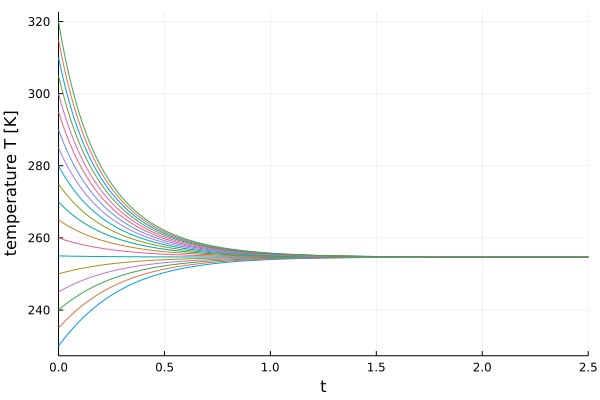

In [3]:
using DifferentialEquations, Plots

function zero_d_ebm(u,p,t) 
    α, S₀, σ = p 
    return (1 - α)*(S₀/4) - σ*u[1]^4
end 

p = [0.3, 1363, 5.67e-8]
u0 = [273.]
prob = ODEProblem(zero_d_ebm, u0, (0.,2.5),p)
u0s = 230:5:320

fig = plot(0,0,xlabel="time",ylabel="temperature T [K]", legend=nothing)
for u0 ∈ u0s 
    plot!(fig, solve(remake(prob;u0=u0)),label=nothing)
end 
fig

* Analytically, we would also find that the fixed point of the system is at $254.7K$:

$$\begin{align}
\sigma T_*^4 &= (1-\alpha)S_0/4\\
       T_*   &= \left(\frac{(1-\alpha)S_0}{4\sigma}\right)^{1/4}
\qquad\text{with}\quad f'(T_*) = -3\sigma T_*^4 < 0\end{align}
$$

#### 0D-EBM with Greenhouse Gases

* That's a too cold because we have not considered the effect of greenhouse gases. 
* The Earth is not a perfect black body: some of the outgoing longwave radiation is absorbed by the athmosphere and/or reflected back by water vapor and CO2
* The simplest ansatz is just to reduce the outgoing radiation by fraction $\varepsilon$, so that with $\varepsilon=0.6$:

$$\begin{align} \frac{dE}{dt} &= (1 - \alpha)\frac{S_0}{4}  - \varepsilon\sigma T^4\\
 T_*   &= \left(\frac{(1-\alpha)S_0}{4\varepsilon\sigma}\right)^{1/4}
\qquad\text{with}\quad f'(T_*) = -3\varepsilon\sigma T_*^4 < 0\end{align}$$


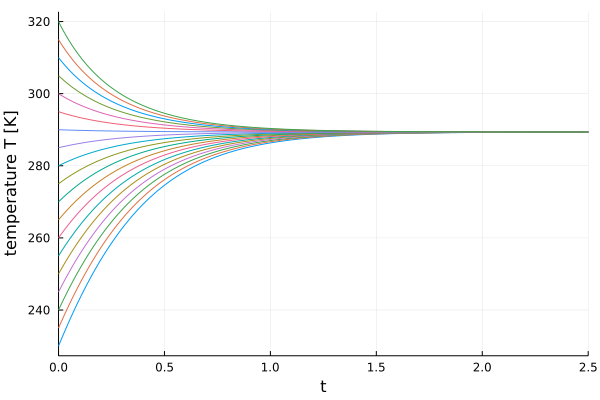

In [4]:
function zero_d_ebm_greenhouse_epsilon(u,p,t) 
    α, S₀, σ, ϵ = p 
    return (1 - α)*(S₀/4) - ϵ*σ*u[1]^4
end 
p = [0.3, 1363, 5.67e-8, 0.6]
u0 = [273.]
prob = ODEProblem(zero_d_ebm_greenhouse_epsilon, u0, (0.,2.5),p)
u0s = 230:5:320

fig = plot(0,0, xlabel="time",ylabel="temperature T [K]", legend=nothing)
for u0 ∈ u0s 
    plot!(fig, solve(remake(prob;u0=u0)),label=nothing)
end 
fig

* Now, this has a equilibrium temperature of $T_* = 289K$ which is about the average surface temperature of the Earth. 

### Budyko's Linear OLR Approach

* Another approach was chosen by [Budyko, 1969](https://onlinelibrary.wiley.com/doi/10.1111/j.2153-3490.1969.tb00466.x)
* Temperature only varies within a small margin, so we write $T = T_0 + T_C$, where $T_C$ is temperature in Celcius and $T_0\approx273K$
* OLR = Outgoing Longwave Radiation 

$$\begin{align} 
            OLR &= \varepsilon\sigma T^4 \\
            OLR &= \varepsilon\sigma (T_0 + T_C)^4 = \varepsilon\sigma T_0 (1 + T_C/T_0)^4\\
        \text{for $T_C/T_0<<1$}\qquad &\approx \varepsilon\sigma T_0 ( 1 + 4T_C/T_0)\\
        &\approx A + B T_C
\end{align}$$

(The approximation is the first term in a binomial expansion)

Budyko was using $A = 202 Wm^{-2}$ and $B = 1.45 W m^{-2} C^{-1}$, estimated from observation data. 

You can test this EBM in the exercise.



### Zero-dimensional EBM with Temperature Dependent Albedo

* Another effect that we haven't considered is that the albedo varies with temperature $\alpha=\alpha(T)$
* Ice-albedo feedback: higher temperatures lead to less snowy and icy surfaces which lead to decrease in albedo which lead to a further increase in temperature
* So, the albedo should decrease with increasing temperature, but the albedo is bound, snow has a albedo of around 0.7, regular soil 0.3
* A good ansatz is modelling it with a $\tanh$

$$\alpha(T) = \alpha_0 - \frac{\alpha_1}{2} (\tanh(T - \hat{T}))$$

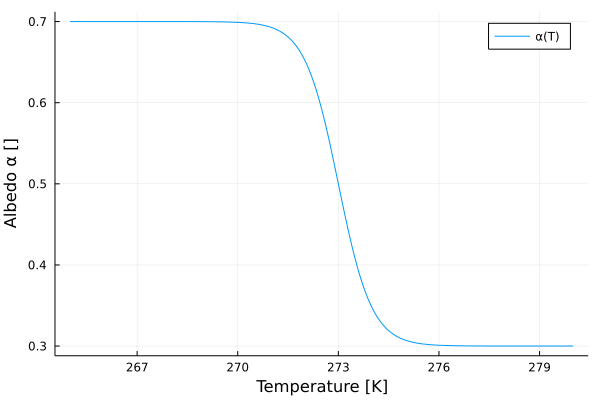

In [5]:
α(T; α₀=0.5, α₁=0.4, T̂=273) = α₀ - (α₁/2)*tanh(T - T̂)
plot(α, xlims=[265,280], xlabel="Temperature [K]", ylabel="Albedo α []", label="α(T)")

* Let's plug that into the EBM 

$$\frac{dE}{dt} = (1 - \alpha_0 + \frac{\alpha_1}{2} (\tanh(T - \hat{T})))\frac{S_0}{4} - \varepsilon\sigma T^4$$

* This leads to some more interesting dynamics, we can see that there are now two fixed points in the system

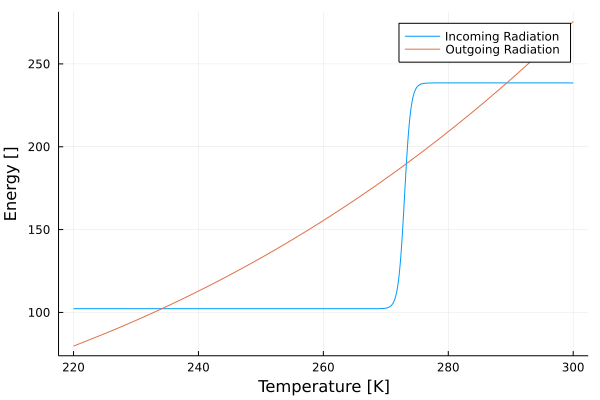

In [6]:
E_in(T; S₀=1363) = (1-α(T))*(S₀/4)
E_out(T; ϵ=0.6, σ=5.67e-8) = ϵ*σ*T^4
plot(E_in, xlims=[220,300], xlabel="Temperature [K]", ylabel="Energy []", label="Incoming Radiation")
plot!(E_out, xlims=[220,300], xlabel="Temperature [K]", ylabel="Energy []", label="Outgoing Radiation")

Our new model has three fixed points! 

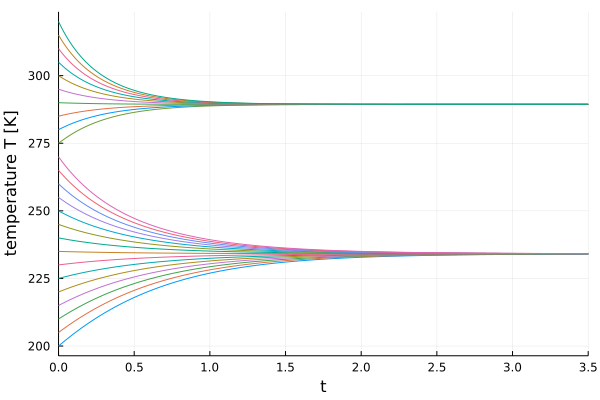

In [7]:
function zero_d_ebm_albedo(u,p,t) 
    S₀, = p
    return [E_in(u[1],S₀=S₀) - E_out(u[1])]
end 

p = [1363]
u0 = [273.]
prob = ODEProblem(zero_d_ebm_albedo, u0, (0.,3.5),p)
u0s = 200:5:320

fig = plot(0,0,xlabel="time",ylabel="temperature T [K]", legend=nothing)
for u0 ∈ u0s 
    plot!(fig, solve(remake(prob;u0=[u0])),label=nothing)
end 
fig

We see the two stable fixed point. An unstable fixed point is their basin boundary. 

* One fixed point at "normal" temperatures $\approx 290K$, one fixed point at very low temperatures
* The lower fixed point corresponds to a version of Earth that is completely frozen over, the *Snowball Earth*

#### Bifurcations 

The solar radition $S_0$ varies over long time scales

* the shape of the Earth’s orbit (eccentricity)
* the angle between the Earth’s rotational axis and the orbital plane
(obliquity)
* the direction the Earth’s rotational axis is pointing (precession)

These effects together constitute the *Milankovic cycles*. They are a crucial part why ice ages occur. 

Therefore, $S_0$ is our control / bifurcation parameter.

In [8]:
S = 500:15:3000
u0s = 200:2:400

bif_diagram = zeros(length(S)*length(u0s),2)
count = 1
for iS ∈ S
    for u0 ∈ u0s 
        bif_diagram[count, 1] = iS
        bif_diagram[count, 2] = solve(remake(prob,p=[iS],u0=[u0],tspan=(0.,5.)))[end][1]
        count += 1 
    end 
end 
scatter(bif_diagram[:,1],bif_diagram[:,2],legend=nothing, xlabel="Solar constant S_0 [W/m^2]", ylabel="Temperature [K]", title="Bifurcation Diagram 0D EBM")

* Snowball Earth is not a regular ice age. In regular ice ages Earth is not completely covered in snow/ice. There is however evidence that the Earth was in a Snowball Earth state 650 Million years ago. After the last complete glaciation multicellular life appeared on Earth. 
* More complex Earth system models also exhibit a similar global stability landscape, they might even have more unstable states in between the stable solutions, [Melancholia states](https://iopscience.iop.org/article/10.1088/1361-6544/ab86cc/meta)
* Climate is a multistable systems, there is no threat of the Earth returning to a Snowball Earth in the next million years, but local climate system can exhibit multistability as well. Tipping elements are part a complex comprehensive stability landscape and are usually similarly the result of competing feedback effects. For the global stability of the EBMs the ice-albedo feedback is crucial, local climate systems have other feedback mechanisms

### One-Dimensional EBMs 

* So far we treaded Earth just as a point with a uniform temperature
* One-Dimensional EBMs make the temperature latitude dependent 
* The basic ansatz is 

$$\begin{align} 
C(\phi) \frac{\partial T}{\partial t} &= E_{in}(\phi,T) - E_{out}(\phi,T) + D(\phi,T,\partial T/\partial \phi, \partial^2 T/\partial \phi^2)
\end{align}$$ 

* $C(\phi)$ is the latitude dependent heat capacity 
* There are in- and outgoing raditation/energy 
* And a diffusion term $D$ 

* We will talk about one of those in a bit more detail in the next lectures, as we will also need some new tools for that



## A Climate Toy Model (with Atmosphere)

* So far, we have an energy balance model, but the climate is more than just the average temperature
* We will look into a conceptual model for the atmosphere now to couple our EBM too, so that we have some kind of "climate toy model" 
* It is not meant to be an accurate represenation of the Earth's climate, but we can use it nonetheless to learn something about some properties of climate models

### The Lorenz 96 System 

* [Lorenz, 1996](https://www.ecmwf.int/en/elibrary/10829-predictability-problem-partly-solved) suggested a simplified model that mimicks the dynamics of an atmosphere to study the predictability of atmospheric quantities
* The paper is a great read on predictability in general! 
* It is often used as a toy model or test scenario to test methods that have to deal with spatiotemporally chaotic systems as it is much, much easier to implement than a proper atmosphere model

* The model is describing some atmospheric quantity $X_i$ along a latitude band $\phi$ at $K$ locations, so that $X_{i+K}=X_{i}$: 

$$\begin{align}
\frac{dX_k}{dt} &= -X_{k-2}X_{k-1} + X_{k-1}X_{k+1} - X_k + F
\end{align}$$

* The first two terms simulate advection, they have a form that is typical for discetized PDEs: e.g. $(X_{k+1} - X_{k-1})$ is a discretized spatial derivative: $dX_k/d\phi$
* The third term simulated dissipiation and dampening, in larger atmospheric models this is due to e.g. temperature relexation or surface of the Earth 
* The fourth term is an external forcing, later we will replace that with an EBM 

In [9]:
function lorenz96!(dy,y,p,t) 
    F, K = p
    
    dy[1]=(y[2]-y[K-1])*y[K]-y[1]+F;
    dy[2]=(y[3]-y[K])*y[1]-y[2]+F;
    dy[K]=(y[1]-y[K-2])*y[K-1]-y[K]+F;
    for j=3:K-1
        dy[j]=(y[j+1]-y[j-2])*y[j-1]-y[j]+F;
    end
end
K = 36 # so 10 degrees of longtitude per node
F = 0.5

u0 = rand(K)
prob = ODEProblem(lorenz96!, u0, (0.,100.), (F, K));
sol = solve(prob);

┌ Info: Saved animation to 
│   fn = /Users/max/Nextcloud/TUM-Dynamics-Lecture/lectures/lecture-8/l96.gif
└ @ Plots /Users/max/.julia/packages/Plots/MzlNY/src/animation.jl:130


Plots.AnimatedGif("/Users/max/Nextcloud/TUM-Dynamics-Lecture/lectures/lecture-8/l96.gif")
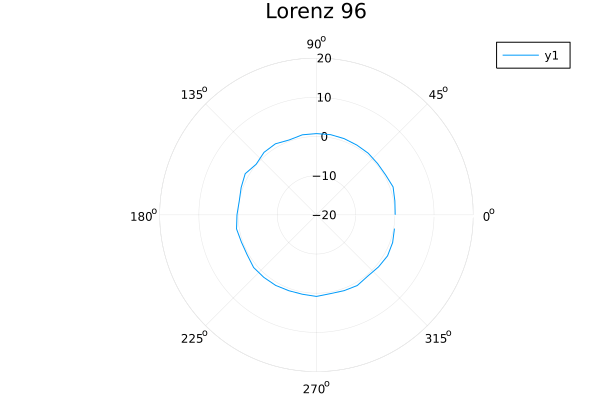

In [10]:
lons = range(0.,2π,length=K+1)[1:end-1] 
t = 0.:0.5:100.
anim = @animate for it ∈ t 
    plot(lons, sol(it), proj=:polar, ylims=[-20,20], title="Lorenz 96")
end 
gif(anim, "l96.gif", fps=10)

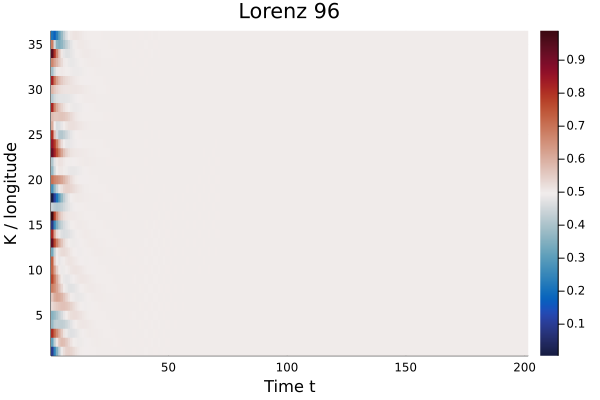

In [11]:
heatmap(Array(sol(t)),c=:balance, ylabel="K / longitude", xlabel="Time t", title="Lorenz 96")

┌ Info: Saved animation to 
│   fn = /Users/max/Nextcloud/TUM-Dynamics-Lecture/lectures/lecture-8/l96.gif
└ @ Plots /Users/max/.julia/packages/Plots/MzlNY/src/animation.jl:130


Plots.AnimatedGif("/Users/max/Nextcloud/TUM-Dynamics-Lecture/lectures/lecture-8/l96.gif")
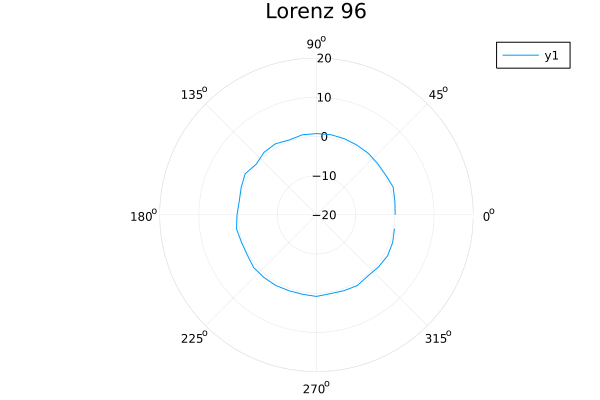

In [12]:
sol = solve(remake(prob, u0=u0, p=(2.,K)));
anim = @animate for it ∈ t 
    plot(lons, sol(it), proj=:polar, ylims=[-20,20], title="Lorenz 96")
end 
gif(anim, "l96.gif", fps=10)

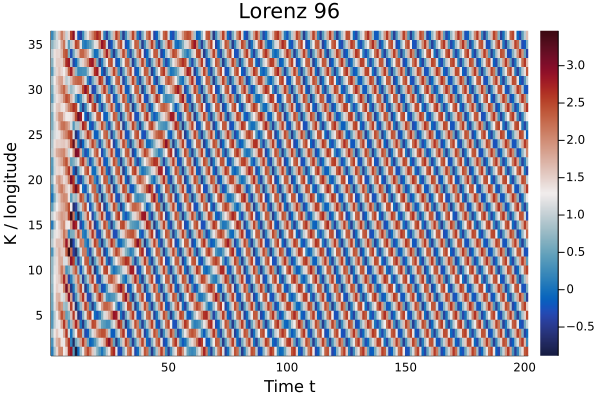

In [13]:
heatmap(Array(sol(t)),c=:balance, ylabel="K / longitude", xlabel="Time t", title="Lorenz 96")

┌ Info: Saved animation to 
│   fn = /Users/max/Nextcloud/TUM-Dynamics-Lecture/lectures/lecture-8/l96.gif
└ @ Plots /Users/max/.julia/packages/Plots/MzlNY/src/animation.jl:130


Plots.AnimatedGif("/Users/max/Nextcloud/TUM-Dynamics-Lecture/lectures/lecture-8/l96.gif")
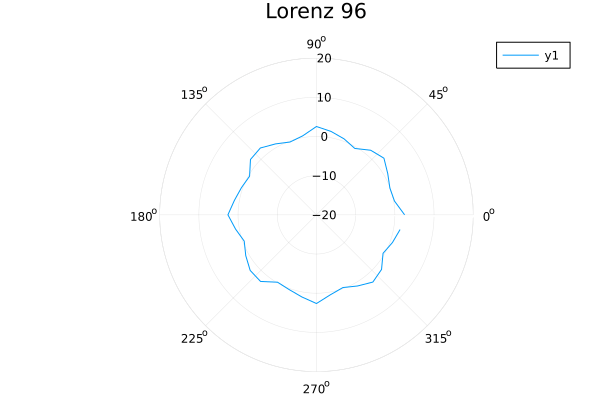

In [14]:
u0 = sol(100.); # new IC 
sol = solve(remake(prob, u0=u0, p=(4.5,K)));
anim = @animate for it ∈ t 
    plot(lons, sol(it), proj=:polar, ylims=[-20,20], title="Lorenz 96")
end 
gif(anim, "l96.gif", fps=10)

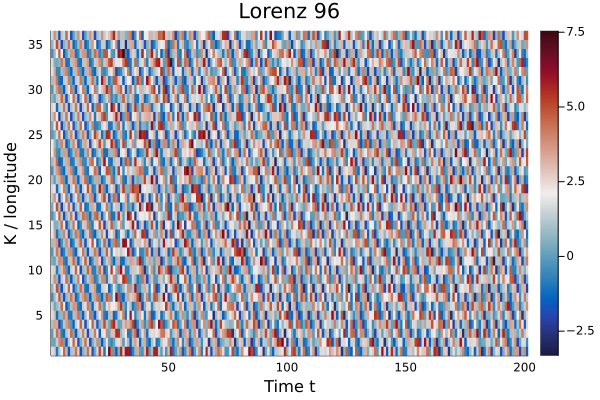

In [15]:
heatmap(Array(sol(t)),c=:balance, ylabel="K / longitude", xlabel="Time t", title="Lorenz 96")

┌ Info: Saved animation to 
│   fn = /Users/max/Nextcloud/TUM-Dynamics-Lecture/lectures/lecture-8/l96.gif
└ @ Plots /Users/max/.julia/packages/Plots/MzlNY/src/animation.jl:130


Plots.AnimatedGif("/Users/max/Nextcloud/TUM-Dynamics-Lecture/lectures/lecture-8/l96.gif")
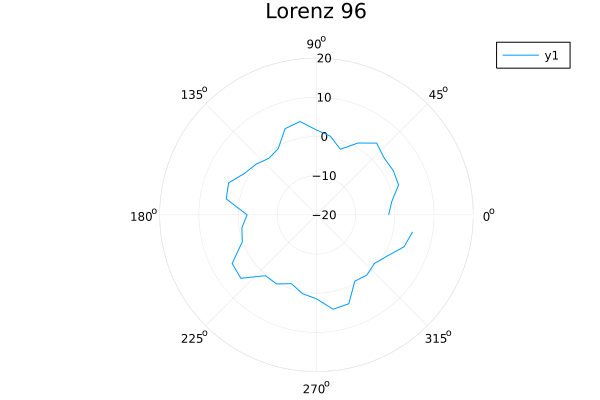

In [16]:
u0 = sol(100.); # new IC 
sol = solve(remake(prob, u0=u0, p=(8.,K)));
anim = @animate for it ∈ t 
    plot(lons, sol(it), proj=:polar, ylims=[-20,20], title="Lorenz 96")
end 
gif(anim, "l96.gif", fps=10)

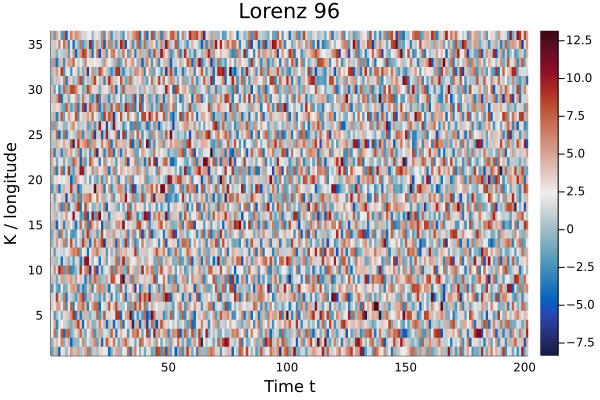

In [17]:
heatmap(Array(sol(t)),c=:balance, ylabel="K / longitude", xlabel="Time t", title="Lorenz 96")

We see the bifurcation to chaos of the Lorenz 96 system dependent on the forcing $F$. The exact bifurcation point depends on $K$. 

┌ Info: Saved animation to 
│   fn = /Users/max/Nextcloud/TUM-Dynamics-Lecture/lectures/lecture-8/l96.gif
└ @ Plots /Users/max/.julia/packages/Plots/MzlNY/src/animation.jl:130


Plots.AnimatedGif("/Users/max/Nextcloud/TUM-Dynamics-Lecture/lectures/lecture-8/l96.gif")
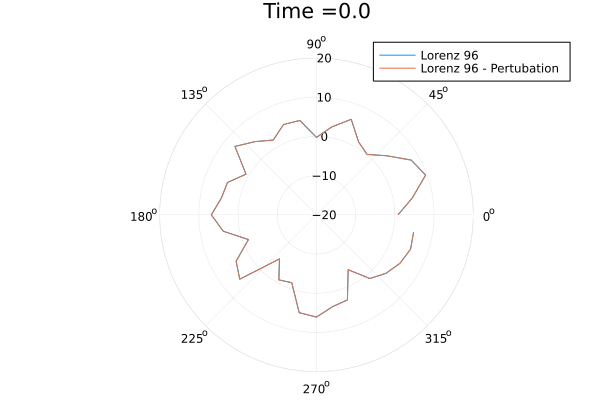

In [18]:
u0 = sol(100.)
u0_2 = u0 .+ 0.00001 # just a small measurement error

sol = solve(remake(prob, u0=u0, p=(8.,K)));
sol2 = solve(remake(prob, u0=u0_2, p=(8.,K)));
anim = @animate for it ∈ t 
    plot(lons, sol(it), proj=:polar, ylims=[-20,20], label="Lorenz 96")
    plot!(lons, sol2(it), proj=:polar, ylims=[-20,20], label="Lorenz 96 - Pertubation", title=string("Time =",it))
end 
gif(anim, "l96.gif", fps=5)

Also for this conceptual atmosphere model we see the effect that Chaos has on predictability 

### Coupling the Lorenz 96 System with an EBM 

* [Gelbrecht,Lucarini, 2021](https://link.springer.com/article/10.1140/epjs/s11734-021-00175-0)
* We can setup a very simple climate toy model by replacing the forcing $F$ with one of our EBMs 

$$\begin{align}\dot{T} &=  S\left( 1 - a_0 + \frac{a_1}{2}\left(\tanh\left(T -
    \tilde{T}\right)\right)\right) - \sigma T^4 - \alpha\left(\frac{\mathcal{E}(\mathbf{X})}{0.6\cdot F^\frac{4}{3}} -1\right)\nonumber\\
    \dot{X}_n &= \left(X_{n+1}-X_{n-2}\right)X_{n-1}-X_n+ F\left(1+\beta\frac{T-\tilde{T}}{\Delta_T}\right)\label{eq:model}\end{align}$$
    
* We have almost the same temperature dependent EBM from before  
* If the temperature of the EBM is higher (lower) than the reference temperature $\tilde{T}$, the L96 model receives an enhanced (reduced) forcing, mimicking —in very rough terms— the presence of higher energy in the atmosphere. 
* A negative feedback in the system is introduced as follows: if the energy per site of the L96 component of the model exceeds the average value realised in the uncoupled case $E \approx 0.6F^{4/3}$ (e.g cloud feedback)

In [19]:
function lorenz96irr_T!(dy,y,p,t)
    R, S, a0, a1, σ, N = p
    
    # EBM 
    dy[N]=S*(1-a0+a1/2*(tanh(y[N]-270)))-σ*y[N]^4-2*(sum(y[1:N-1].^2)/2/(N-1)-0.6*R^(4/3))/(0.6*R^(4/3));
    
    F = R*(1+(y[N]-270)/30/2); 
    
    # L96
    dy[1]=(y[2]-y[N-2])*y[N-1]-y[1]+F;
    dy[2]=(y[3]-y[N-1])*y[1]-y[2]+F;
    dy[N-1]=(y[1]-y[N-3])*y[N-2]-y[N-1]+F;
    for j=3:N-2
        dy[j]=(y[j+1]-y[j-2])*y[j-1]-y[j]+F;
    end
end

begin
    R = 8. 
    N = 41
    S = 10.
    a0 = 0.5
    a1 = 0.4
    σ = 1/180^4

    p = (R, S, a0, a1, σ, N)
    
    tspan = (0.,400.)
    
    u0 = [rand(N-1) .- 0.5; 273]
    prob = ODEProblem(lorenz96irr_T!, u0, tspan, p);
end
sol = solve(prob);
sol2 = solve(remake(prob, u0=[rand(N-1) .- 0.5; 269]));

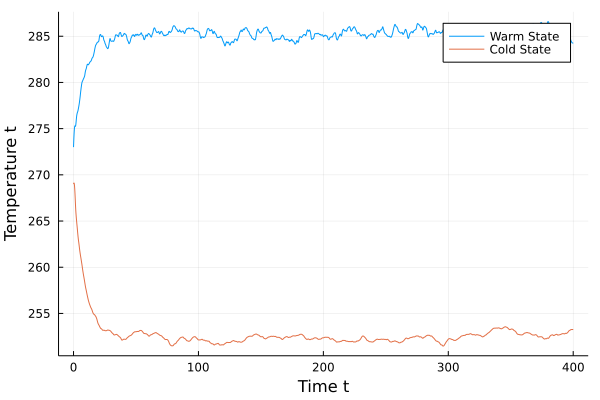

In [20]:
plot(sol.t, Array(sol)[N,:], xlabel="Time t", ylabel="Temperature t", label="Warm State")
plot!(sol2.t, Array(sol2)[N,:], xlabel="Time t", ylabel="Temperature t", label="Cold State")

┌ Info: Saved animation to 
│   fn = /Users/max/Nextcloud/TUM-Dynamics-Lecture/lectures/lecture-8/l96ebm.gif
└ @ Plots /Users/max/.julia/packages/Plots/MzlNY/src/animation.jl:130


Plots.AnimatedGif("/Users/max/Nextcloud/TUM-Dynamics-Lecture/lectures/lecture-8/l96ebm.gif")
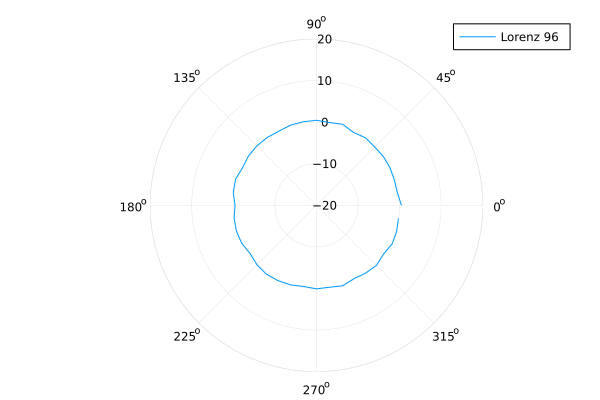

In [21]:
t=0.:0.2:100.
lons = range(0.,2π,length=N)[1:end-1] 

anim = @animate for it ∈ t 
    plot(lons, sol(it)[1:end-1], proj=:polar, ylims=[-20,20], label="Lorenz 96")
end 
gif(anim, "l96ebm.gif", fps=5)

* For this model we also find the hyseteris with a bistable. 

<div>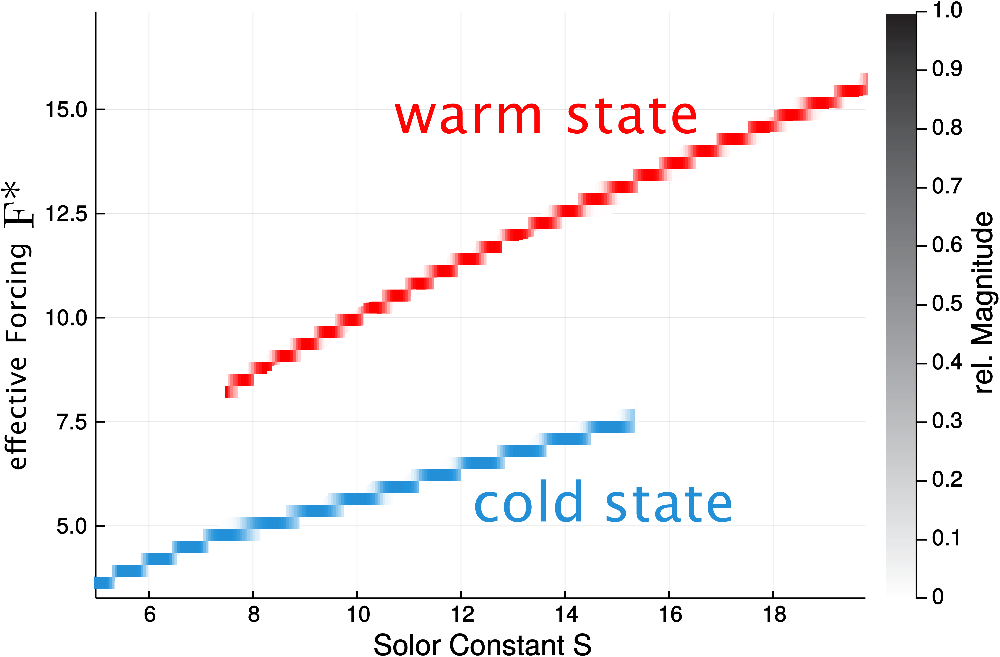</div> 

(Figure from Gelbrecht, Lucarini et al EPJ ST, embedded figure won't work in html file, here's a [link](https://link.springer.com/article/10.1140/epjs/s11734-021-00175-0/figures/4))


* Here, it also impacts how chaotic the model is, the warm state has a larger Lyapunov exponent than the cold state